# New noise removal

The idea of this script is to get a first overview of our plan of implementing a new noise removal function. I downloaded the mock catalog and will do a coarse clustering (= without any noise removal) with 1 KNN and 1 SF for starters. Then I will take a look at the rho variable.

Also takes into consideration the SEB_RunSigMA-FixNoiseRemoval.ipynb file

### Modules

In [46]:
from astropy.stats import knuth_bin_width, freedman_bin_width
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import normalized_mutual_info_score as nmi
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.io as pio
pio.renderers.default = "notebook"



from SigMA.SigMA import SigMA
from DistantSigMA.Analysis.IsochroneArchive.myTools import my_utility


### Set output paths

In [47]:
# ---------------------------------------------------------
# Set output directory and path
script_name = "noise_removal-first_steps"
output_path = my_utility.set_output_path(main_path='/Users/alena/Library/CloudStorage/OneDrive-Personal/Work/PhD/'
                                                   'Projects/Sigma_Orion/Coding/Code_output/', script_name=script_name)

### Data

In [48]:
# ---------------------------------------------------------
# Load data
mock_df = pd.read_csv("/Users/alena/PycharmProjects/Distant_SigMA/Data/Mock/Box_0_with_all_clustering_results.csv")


data = mock_df.loc[mock_df['parallax']>0]
data = data.loc[data['parallax']/data['parallax_error']>4.5].reset_index(drop=True)

data.shape

(57622, 33)

## 1. Simple clustering

### 1.1. Setup

In [49]:
# ---------------------------------------------------------
# Clustering in XYZ and tangential velocity space
pm_axes = ['pmra', 'pmdec']
# v_tan_axes = ['v_a_lsr', 'v_d_lsr']  # tangential velocity in LSR

# Clustering in XYZ and UVW space
xyz_axes = ['ra', 'dec', 'parallax']
# uvw_axes = ['U', 'V', 'W']


cluster_features = xyz_axes + pm_axes
scale_factors = {'vel': {'features': ['parallax'], 'factor': 0.2}}

sigma_kwargs = dict(
    cluster_features=cluster_features,
    scale_factors=scale_factors,
    # These are the default values and should be kept for now
    nb_resampling=0, max_knn_density=101,
    beta=0.99, knn_initcluster_graph=45,
    do_remove_edges=True
)

### 1.2. Run clustering

In [50]:
%%time
clusterer = SigMA(data=data, **sigma_kwargs).fit(alpha=0.05, knn=15, bh_correction=True)

Performing gradient ascend using a 15-NN density estimation.
Updated significance threshold: 1.00e-05
CPU times: user 9.01 s, sys: 216 ms, total: 9.23 s
Wall time: 4.87 s


In [51]:
np.unique(clusterer.labels_, return_counts=True)


(array([   65,   472,  1312,  1636,  2411,  3302,  4314,  4952,  5173,
         5877,  6751,  7547,  8869,  9074,  9337, 10156, 10500, 11322,
        11755, 13217, 14120, 14539, 15524, 16703, 17935, 19583, 20322,
        20768, 21802, 22526]),
 array([  376,   777,   231,   958,   464,   621,  1214,   453,   220,
          793,   916,   671,  1268,   326, 35064,   915,   613,   659,
          796,   763,  1195,   831,  1249,   519,  1746,  1427,   201,
         1058,  1104,   194]))

In [52]:
nmi(data.labels, clusterer.labels_)

np.float64(0.9612101676584978)

In [53]:
np.unique(data.labels.to_numpy(), return_counts=True)

(array([ -1,   6,  12,  17,  32,  47,  50,  72,  78,  87,  88,  93, 109,
        111, 124, 133, 140, 149, 150, 171, 177, 178, 190, 194, 198, 219,
        221, 226, 234, 240, 245]),
 array([34957,   378,   774,   229,   924,   463,   624,  1283,   449,
          215,   800,   924,   646,  1253,   318,   197,   930,   607,
          660,   789,   755,  1195,   828,  1264,   522,  1719,  1395,
          199,  1026,  1106,   193]))

In [54]:
data = data.drop("labels", axis=1)
data.columns

Index(['ra', 'dec', 'parallax', 'pmra', 'pmdec', 'radial_velocity',
       'phot_g_mean_mag', 'phot_bp_mean_mag', 'phot_rp_mean_mag',
       'parallax_error', 'pmra_error', 'pmdec_error', 'radial_velocity_error',
       'logAge', 'U_bulk', 'V_bulk', 'W_bulk', 'v_a', 'v_d', 'X', 'Y', 'Z',
       'hdbscan_labels_Cartesian', 'hdbscan_labels_ICRS',
       'SigMA_labels_ICRS_0.01_False', 'SigMA_labels_ICRS_0.05_True',
       'SigMA_labels_cartesian_0.01_False', 'SigMA_labels_cartesian_0.05_True',
       'v_a_lsr', 'v_d_lsr', 'New_SigMA_labels_ICRS_0.01_False',
       'New_SigMA_labels_ICRS_0.05_True'],
      dtype='object')

### 2. Inspect density vs. Number of stars

In [55]:
rho = clusterer.weights_
rho.shape

(57622,)

In [56]:
labels_real = LabelEncoder().fit_transform(clusterer.labels_)  # Transform to 0 - (N-1)
labels_real.shape

(57622,)

In [57]:
label_rho_df = pd.DataFrame(data=np.stack([labels_real, rho], axis=1), columns=["labels_SigMA", "density"])
label_rho_df.labels_SigMA = label_rho_df.labels_SigMA.astype(int)
label_rho_df = label_rho_df.sort_values(by="labels_SigMA")

label_rho_df.head()

,labels_SigMA,density
0,0,0.230469
258,0,1.716686
257,0,1.489335
256,0,1.865155
255,0,2.023275


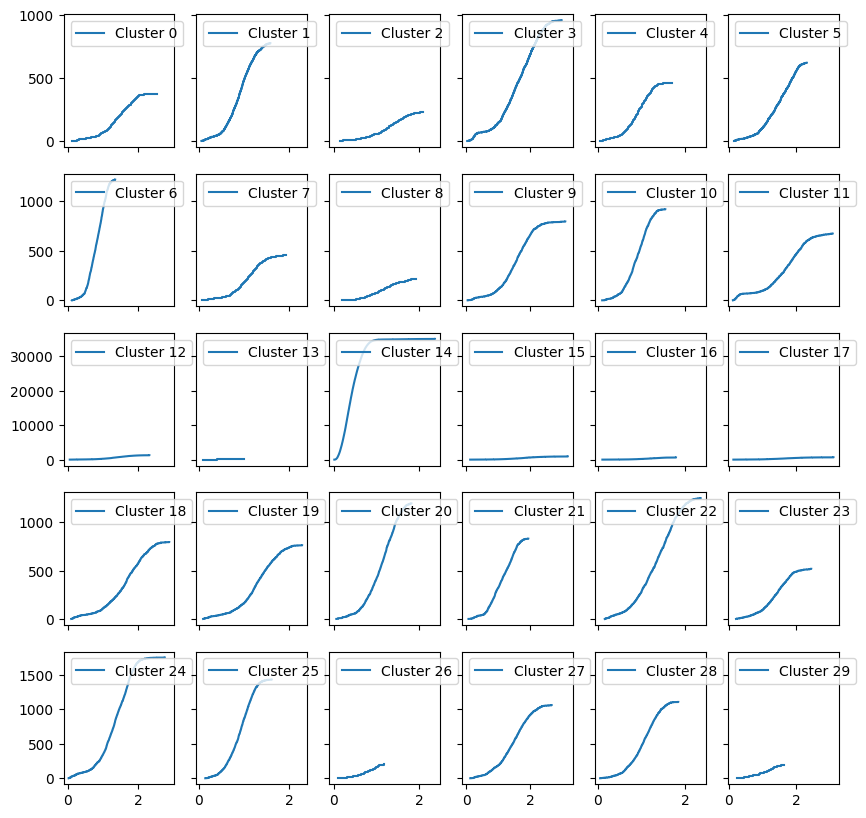

In [58]:
f,ax = plt.subplots(5,6, sharex="col", sharey="row", figsize=(10,10))
axes = ax.ravel()

for label in label_rho_df.labels_SigMA.unique():
    # pick one cluster
    cluster = label_rho_df[label_rho_df.labels_SigMA == label]
    cluster_sorted = cluster.sort_values(by="density")
    sorted_densities = cluster_sorted.density.to_numpy()
    unique_densities, counts = np.unique(sorted_densities, return_counts=True)
    cumulative_counts = np.cumsum(counts)
    axes[label].step(unique_densities, cumulative_counts, where='post', label= f"Cluster {label}")
    axes[label].legend(loc="upper left")
plt.show()

### 2.1. Try KneeLocator

In [59]:
# test cluster
cluster = label_rho_df[label_rho_df.labels_SigMA == 27]
cluster_sorted = cluster.sort_values(by="density")
sorted_densities = cluster_sorted.density.to_numpy()
unique_densities, counts = np.unique(sorted_densities, return_counts=True)
cumulative_counts = np.cumsum(counts)

In [60]:
min_density = unique_densities[0] + unique_densities[0] *0.05
max_density = unique_densities[-1] - unique_densities[-1] *0.05

# Create a mask for densities within desired range
mask = (unique_densities >= min_density) & (unique_densities <= max_density)

# Filter arrays accordingly
filtered_densities = unique_densities[mask]
filtered_counts = counts[mask]
filtered_cumulative_counts = np.cumsum(filtered_counts)

In [61]:
print(unique_densities[0], unique_densities[-1])
print(min_density, max_density)

0.12331538535933124 2.676529528505325
0.1294811546272978 2.542703052080059


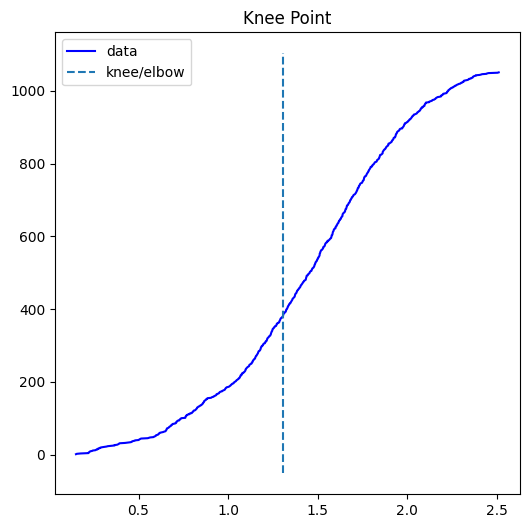

In [62]:
from kneed import KneeLocator

kl = KneeLocator(x=filtered_densities, y = filtered_cumulative_counts, curve="convex", online=True, interp_method="polynomial", polynomial_degree=3, S =1e3)
kl.plot_knee()

{np.float64(1.9975644535854031), np.float64(2.5108035270218916), np.float64(2.41770907173865), np.float64(2.365940354767832), np.float64(2.382660141307478), np.float64(2.376030056733382), np.float64(2.355827924650304), np.float64(2.3441647230955063), np.float64(2.314893245855224), np.float64(2.299561778377336), np.float64(2.274769686214026), np.float64(1.6557867938851984), np.float64(1.6247296366176869), np.float64(1.5906807754129204), np.float64(1.5394653045949482), np.float64(1.4163111801304427), np.float64(1.8955542752078363), np.float64(1.6715471097215944), np.float64(1.5760101770987451), np.float64(1.398623129919479), np.float64(2.1891964065646694), np.float64(2.0253835576887984), np.float64(1.5845079129939215), np.float64(1.511445242384341), np.float64(1.3679065440783595), np.float64(1.326566042596341), np.float64(1.8204005914837547), np.float64(1.465273273921107), np.float64(1.404768866185436), np.float64(2.0843766254982237), np.float64(1.7201839953051856), np.float64(1.55595095

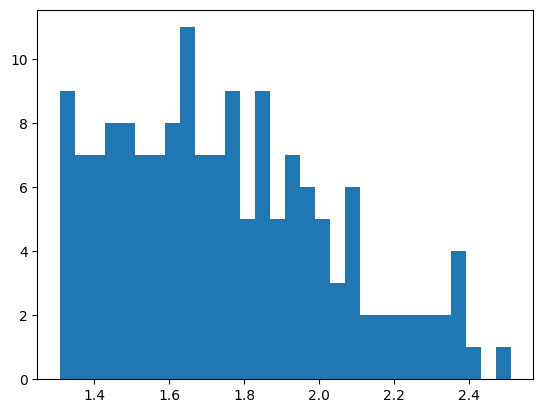

In [63]:
all_elbows = kl.all_elbows
print(all_elbows, len(all_elbows))
plt.hist(all_elbows, bins=30)
print(min(all_elbows))

### 2.2. Try kneed on the big sample

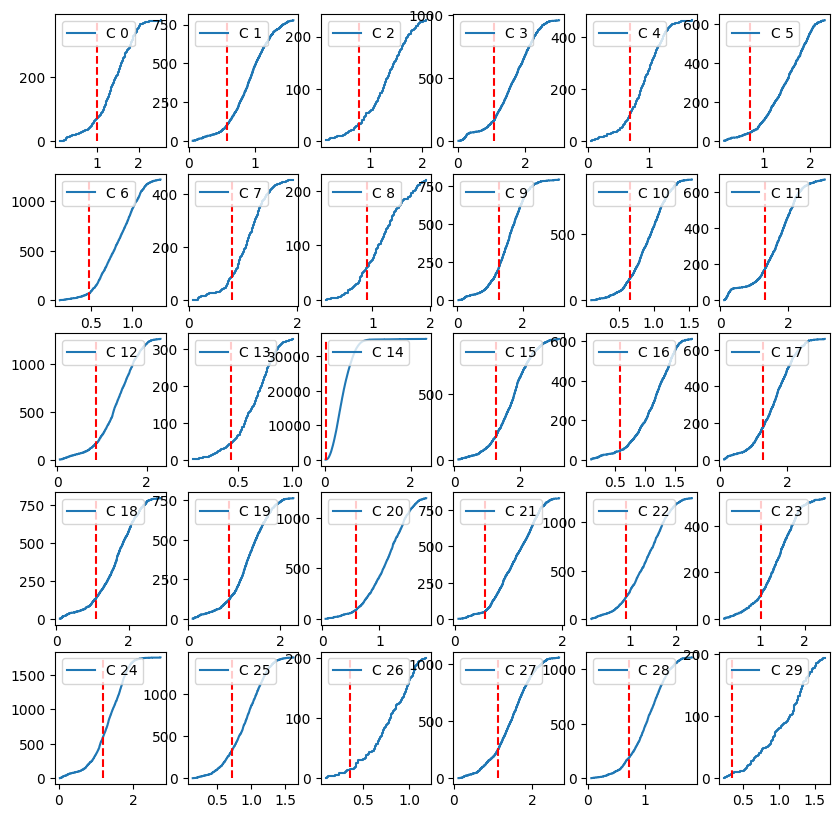

In [64]:
f,ax = plt.subplots(5,6, figsize=(10,10))
axes = ax.ravel()

nstar_elbows_unbinned = []
nstar_counts_unbinned = []

for label in label_rho_df.labels_SigMA.unique():
    # pick one cluster
    cluster = label_rho_df[label_rho_df.labels_SigMA == label]
    cluster_sorted = cluster.sort_values(by="density")
    sorted_densities = cluster_sorted.density.to_numpy()
    unique_densities, counts = np.unique(sorted_densities, return_counts=True)
    cumulative_counts = np.cumsum(counts)


    min_density = unique_densities[0] + unique_densities[0] *0.15
    max_density = unique_densities[-1] - unique_densities[-1] *0.15

    # Create a mask for densities within desired range
    mask = (unique_densities >= min_density) & (unique_densities <= max_density)

    # Filter arrays accordingly
    filtered_densities = unique_densities[mask]
    filtered_counts = counts[mask]
    filtered_cumulative_counts = np.cumsum(filtered_counts)

    kl = KneeLocator(x=filtered_densities, y = filtered_cumulative_counts, curve="convex", online=True, interp_method="polynomial", polynomial_degree=3, S =1e3)
    min_elbow = min(kl.all_elbows)
    nstar_elbows_unbinned.append(min_elbow)

    star_counts = (sorted_densities >= min_elbow).sum()
    nstar_counts_unbinned.append(star_counts)

    axes[label].step(unique_densities, cumulative_counts, where='post', label= f"C {label}")
    axes[label].vlines(x=min_elbow, ymin =0, ymax=max(cumulative_counts), color="red", ls="dashed")
    axes[label].legend(loc="upper left")

f.savefig(output_path+"kneed_1.png", dpi=300)

plt.show()

## Lessons learned from kneed fitting

- Online = True is essential, otherwise the location will be an endpoint
- interp_method = "polynomial" seems to do the trick, with n=3
- **Worked with S = 1000 - 10000 -> not sure why I need to ramp it up this high**
- most importantly, cap the highest density part because it will mess up the results

-> use minimum elbow for now



### 2.3. Density binning

In [65]:
# test cluster
cluster = label_rho_df[label_rho_df.labels_SigMA == 27]
cluster_sorted = cluster.sort_values(by="density")
sorted_densities = cluster_sorted.density.to_numpy()

min_density = sorted_densities[0] + sorted_densities[0] *0.1
max_density = sorted_densities[-1] - sorted_densities[-1] *0.1

# Create a mask for densities within desired range
mask = (sorted_densities >= min_density) & (sorted_densities <= max_density)

# Filter arrays accordingly
filtered_densities = sorted_densities[mask]

In [66]:
# Compute bin width and bin edges
bin_width, bins = freedman_bin_width(filtered_densities, return_bins=True)
# Compute histogram using the bins
hist_counts, bin_edges = np.histogram(filtered_densities, bins=bins)
# Compute cumulative counts
cumulative_counts = np.cumsum(hist_counts)
# For plotting (optional): get bin centers
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

In [67]:
bin_centers.shape

(18,)

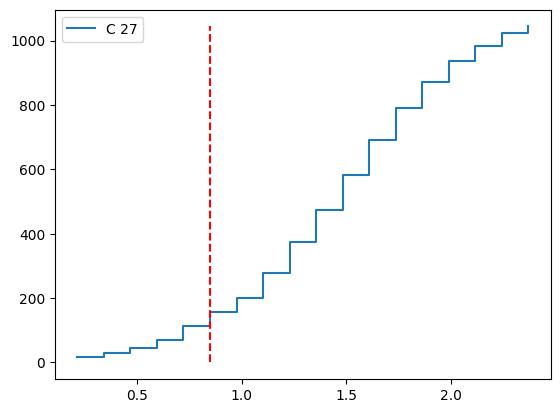

In [68]:
kl = KneeLocator(x=bin_centers, y = cumulative_counts, curve="convex", online=True, interp_method="polynomial", polynomial_degree=3, S =1)
min_elbow = min(kl.all_elbows)

g,axes = plt.subplots(1,1)
axes.step(bin_centers, cumulative_counts, where='post', label= f"C 27")
axes.vlines(x=min_elbow, ymin =0, ymax=max(cumulative_counts), color="red", ls="dashed")
axes.legend(loc="upper left")




### 2.4. Test on all clusters

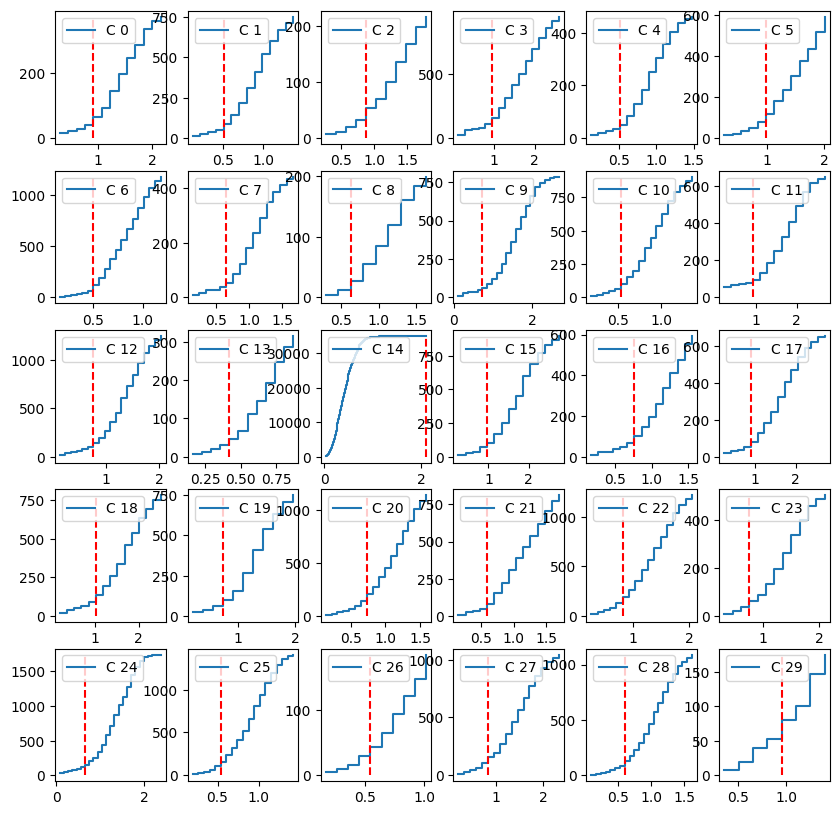

In [69]:
f,ax = plt.subplots(5,6, figsize=(10,10))
axes = ax.ravel()

nstar_elbows_binned, nstar_counts_binned = [], []

for label in label_rho_df.labels_SigMA.unique():
    # pick one cluster
    cluster = label_rho_df[label_rho_df.labels_SigMA == label]
    cluster_sorted = cluster.sort_values(by="density")
    sorted_densities = cluster_sorted.density.to_numpy()
    min_density = sorted_densities[0] + sorted_densities[0] *0.1
    max_density = sorted_densities[-1] - sorted_densities[-1] *0.1

    # Create a mask for densities within desired range
    mask = (sorted_densities >= min_density) & (sorted_densities <= max_density)

    # Filter arrays accordingly
    filtered_densities = sorted_densities[mask]

    # Compute bin width and bin edges
    bin_width, bins = knuth_bin_width(filtered_densities, return_bins=True)
    # Compute histogram using the bins
    hist_counts, bin_edges = np.histogram(filtered_densities, bins=bins)
    # Compute cumulative counts
    cumulative_counts = np.cumsum(hist_counts)
    # For plotting (optional): get bin centers
    bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

    kl = KneeLocator(x=bin_centers, y = cumulative_counts, curve="convex", online=True, interp_method="polynomial", polynomial_degree=3, S =1)
    min_elbow = min(kl.all_elbows)
    nstar_elbows_binned.append(min_elbow)

    star_counts = (sorted_densities >= min_elbow).sum()
    nstar_counts_binned.append(star_counts)

    axes[label].step(bin_centers, cumulative_counts, where='post', label= f"C {label}")
    axes[label].vlines(x=min_elbow, ymin =0, ymax=max(cumulative_counts), color="red", ls="dashed")
    axes[label].legend(loc="upper left")



plt.show()

## Lessons learned

- With binning (Freedman better than Knuth) and sensible cutoffs the knee location works really well as long as there are enough stars!
- I was able to set S=1, which is the recommended value in their papers

## 3. Inspect density vs. velocity dispersion

Velocity dispersion: $\sigma_{v}^2 = \sigma_{v_{a,lsr}}^2 + \sigma_{v_{d,lsr}}^2$

In [70]:
def calc_velocity_dispersion(df):

    v_x = df.v_a_lsr.to_numpy()
    v_y = df.v_d_lsr.to_numpy()

    return np.var(v_x) + np.var(v_y)


### 3.1. Without binning

In [71]:
labels_real = LabelEncoder().fit_transform(clusterer.labels_)  # Transform to 0 - (N-1)

res_df = data.copy()

res_df["labels_SigMA"] = labels_real
res_df["density"] = rho
res_df.labels_SigMA = label_rho_df.labels_SigMA.astype(int)
res_df = res_df.sort_values(by="labels_SigMA")

res_df.head()

,ra,dec,parallax,pmra,pmdec,radial_velocity,phot_g_mean_mag,phot_bp_mean_mag,phot_rp_mean_mag,parallax_error,...,SigMA_labels_ICRS_0.01_False,SigMA_labels_ICRS_0.05_True,SigMA_labels_cartesian_0.01_False,SigMA_labels_cartesian_0.05_True,v_a_lsr,v_d_lsr,New_SigMA_labels_ICRS_0.01_False,New_SigMA_labels_ICRS_0.05_True,labels_SigMA,density
0,126.520428,-40.651910,2.793324,14.884725,-5.449735,NaN,19.791882,NaN,18.354247,0.520399,...,-1,-1,-1,-1,35.809476,-12.226346,-1,-1,0,0.230469
258,128.000705,-40.475548,1.251561,9.353229,0.109029,NaN,15.347680,16.025574,14.561789,0.034658,...,-1,-1,0,0,46.303268,-2.340988,-1,-1,0,1.716686
257,126.788074,-41.435552,1.295561,10.134541,-0.634023,NaN,15.489590,16.166212,14.653303,0.036832,...,-1,-1,0,0,47.691172,-5.460700,-1,-1,0,1.489335
256,127.954303,-41.457324,1.271096,8.164285,-0.745519,NaN,15.700401,16.413976,14.867536,0.041045,...,-1,-1,0,0,41.314542,-5.781879,-1,-1,0,1.865155
255,127.004249,-41.574966,1.306620,9.471009,-0.904461,NaN,15.724266,16.448531,14.883126,0.041593,...,-1,-1,0,0,45.018073,-6.430279,-1,-1,0,2.023275


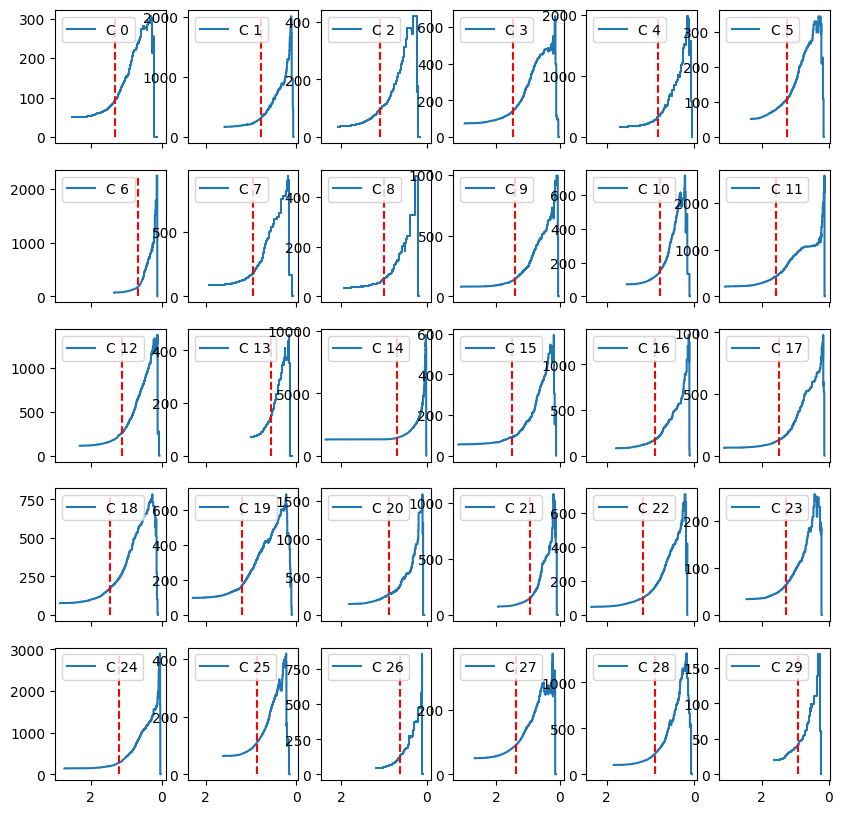

In [72]:
f,ax = plt.subplots(5,6, sharex="col", figsize=(10,10))
axes = ax.ravel()

v_disp_elbows_unbinned, v_disp_counts_unbinned = [], []

for label in res_df.labels_SigMA.unique()[:]:
    # pick one cluster
    cluster = res_df[res_df.labels_SigMA == label]
    cluster_sorted = cluster.sort_values(by="density")
    sorted_densities = cluster_sorted.density.to_numpy()
    unique_densities, counts = np.unique(sorted_densities, return_counts=True)
    cumulative_counts = np.cumsum(counts)

    min_density = unique_densities[0] + unique_densities[0] *0.
    max_density = unique_densities[-1] - unique_densities[-1] *0.

    # Create a mask for densities within desired range
    mask = (unique_densities >= min_density) & (unique_densities <= max_density)

    # Filter arrays accordingly
    filtered_densities = unique_densities[mask]
    filtered_counts = counts[mask]
    filtered_cumulative_counts = np.cumsum(filtered_counts)

    v_dispersions = []

    for rho_i in filtered_densities:
        subset = cluster_sorted[cluster_sorted.density <= rho_i]
        result_i = calc_velocity_dispersion(subset)  # Replace with your actual function
        v_dispersions.append(result_i)

    v_dispersions = np.array(v_dispersions)

    kl = KneeLocator(x=filtered_densities, y = v_dispersions, curve="convex", online=True, direction="decreasing", interp_method="polynomial",polynomial_degree=2, S =1)
    elbows = list(kl.all_elbows)
    max_elbow = max(elbows)
    v_disp_elbows_unbinned.append(max_elbow)
    star_counts = (sorted_densities >= max_elbow).sum()
    v_disp_counts_unbinned.append(star_counts)

    axes[label].step(filtered_densities, v_dispersions, where='post', label= f"C {label}")
    axes[label].vlines(x=max_elbow, ymin =0, ymax=max(v_dispersions), color="red", ls="dashed")
    axes[label].invert_xaxis()
    axes[label].legend(loc="upper left")

plt.show()

In [73]:
max(kl.all_elbows)

np.float64(0.9290715425735196)

In [74]:
max(elbows)

np.float64(0.9290715425735196)

## Lessons learned

- The calculation method right now is super slow
- there are some interesting saddle points in the velocity dispersion diagrams that we should follow up on in the interactive plots
- The kneelocator is very stubborn here:
    - Switched from polynomial to interp1d fitting
    - played with the S value
    - Tried using the mean and median knees instead of min/max (mean seems to perform best but still not perfect)

### Update after binning

- If I set polynomial degree = 2 and direction = decreasing the normal S=1 and max(elbows) works reasonably well again

### 3.2. With binning

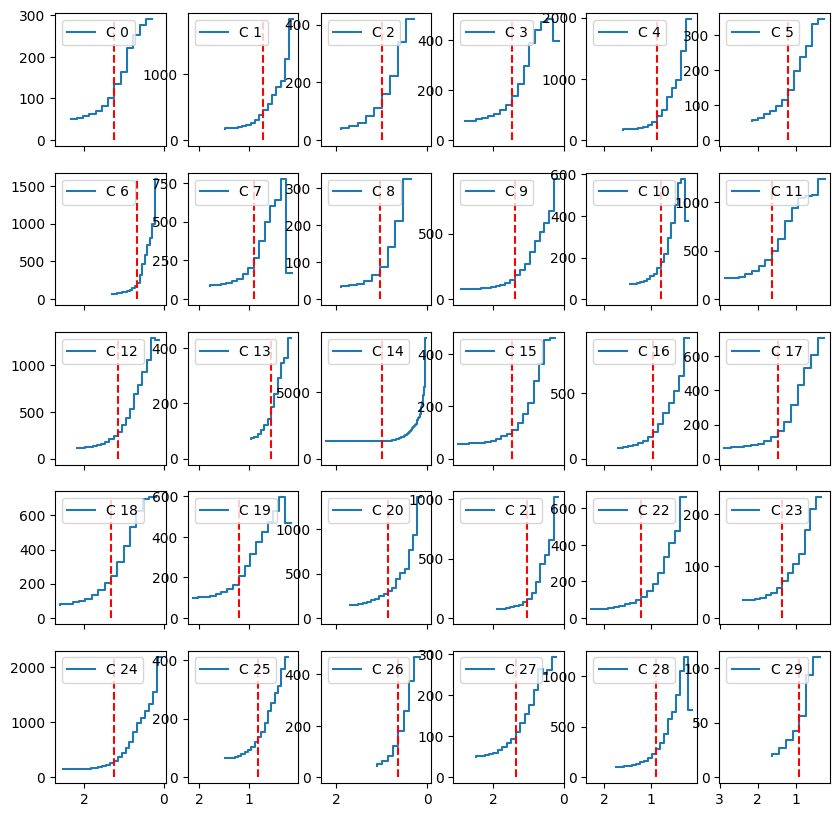

In [75]:
f,ax = plt.subplots(5,6, sharex="col", figsize=(10,10))
axes = ax.ravel()

v_disp_elbows_binned, v_disp_counts_binned = [], []

for label in res_df.labels_SigMA.unique()[:]:
    # pick one cluster
    cluster = res_df[res_df.labels_SigMA == label]
    cluster_sorted = cluster.sort_values(by="density")
    sorted_densities = cluster_sorted.density.to_numpy()
    unique_densities, counts = np.unique(sorted_densities, return_counts=True)

    min_density = unique_densities[0] + unique_densities[0] *0.15
    max_density = unique_densities[-1] - unique_densities[-1] *0.05

    # Create a mask for densities within desired range
    mask = (unique_densities >= min_density) & (unique_densities <= max_density)

    # Filter arrays accordingly
    filtered_densities = unique_densities[mask]

    # Compute bin width and bin edges
    bin_width, bins = freedman_bin_width(filtered_densities, return_bins=True)
    # Compute histogram using the bins
    hist_counts, bin_edges = np.histogram(filtered_densities, bins=bins)
    # Compute cumulative counts
    cumulative_counts = np.cumsum(hist_counts)
    # For plotting (optional): get bin centers
    bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

    v_dispersions = []

    for rho_i in bin_centers:
        subset = cluster_sorted[cluster_sorted.density <= rho_i]
        result_i = calc_velocity_dispersion(subset)  # Replace with your actual function
        v_dispersions.append(result_i)

    v_dispersions = np.array(v_dispersions)

    kl = KneeLocator(x=bin_centers, y = v_dispersions, curve="convex", online=True, direction="decreasing",interp_method="polynomial",polynomial_degree=2, S =1)
    elbows = list(kl.all_elbows)
    max_elbow = max(elbows)
    v_disp_elbows_binned.append(max_elbow)

    star_counts = (sorted_densities >= max_elbow).sum()
    v_disp_counts_binned.append(star_counts)

    axes[label].step(bin_centers, v_dispersions, where='post', label= f"C {label}")
    axes[label].vlines(x=max_elbow, ymin =0, ymax=max(v_dispersions), color="red", ls="dashed")
    axes[label].invert_xaxis()
    axes[label].legend(loc="upper left")

plt.show()

## 4. Compare the elbow points


In [76]:
print(res_df.labels_SigMA.unique())

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29]


### 4.1. Threshold density

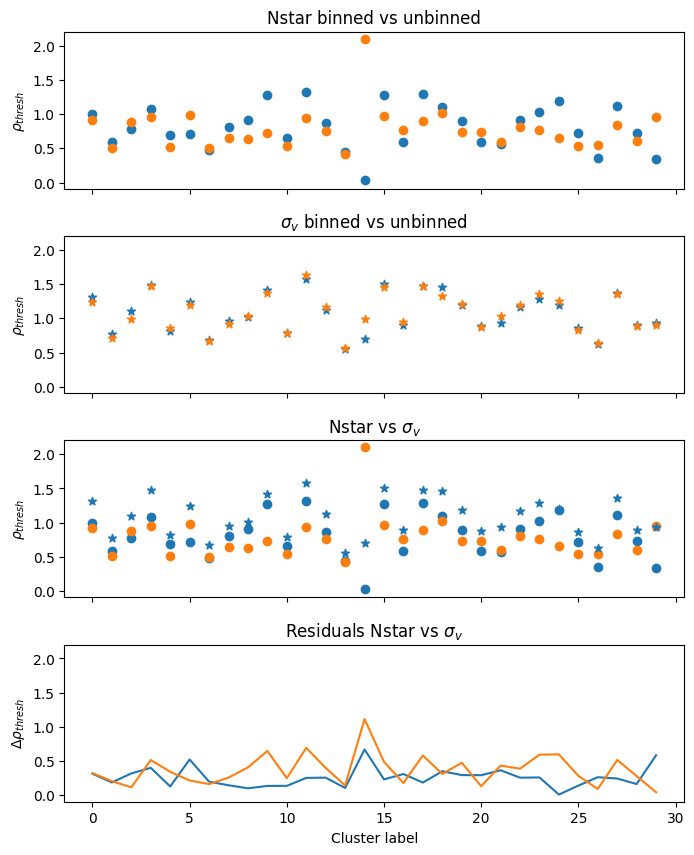

In [77]:
fig,ax = plt.subplots(4,1, sharey="col",sharex="col", figsize=(8,10))

ax[0].scatter(res_df.labels_SigMA.unique(), nstar_elbows_unbinned, label="Nstar unbinned")
ax[0].scatter(res_df.labels_SigMA.unique(), nstar_elbows_binned, label="Nstar binned")
ax[0].set_title("Nstar binned vs unbinned")
ax[1].scatter(res_df.labels_SigMA.unique(), v_disp_elbows_unbinned, label=r"$\sigma_v$ unbinned", marker="*", )
ax[1].scatter(res_df.labels_SigMA.unique(), v_disp_elbows_binned, label=r"$\sigma_v$ binned", marker="*")
ax[1].set_title(r"$\sigma_{v}$ binned vs unbinned")
ax[2].scatter(res_df.labels_SigMA.unique(), nstar_elbows_unbinned, label="Nstar unbinned")
ax[2].scatter(res_df.labels_SigMA.unique(), nstar_elbows_binned, label="Nstar binned")
ax[2].scatter(res_df.labels_SigMA.unique(), v_disp_elbows_unbinned, label=r"$\sigma_v$ unbinned", marker="*", color='#1f77b4')
ax[2].set_title(r"Nstar vs $\sigma_{v}$")
ax[3].plot(res_df.labels_SigMA.unique(), abs(np.array(nstar_elbows_unbinned)-np.array(v_disp_elbows_unbinned)), label="unbinned")
ax[3].plot(res_df.labels_SigMA.unique(), abs(np.array(nstar_elbows_binned)-np.array(v_disp_elbows_binned)), label="binned")
ax[3].set_title(r"Residuals Nstar vs $\sigma_{v}$")
#ax[3].set_ylim(0,1.2)




ax[3].set_xlabel("Cluster label")
ax[0].set_ylabel(r"$\rho_{thresh}$")
ax[1].set_ylabel(r"$\rho_{thresh}$")
ax[2].set_ylabel(r"$\rho_{thresh}$")
ax[3].set_ylabel(r"$\Delta \rho_{thresh}$")

plt.subplots_adjust(hspace=0.3)

plt.show()

### 4.2 Star count in the "clusters"

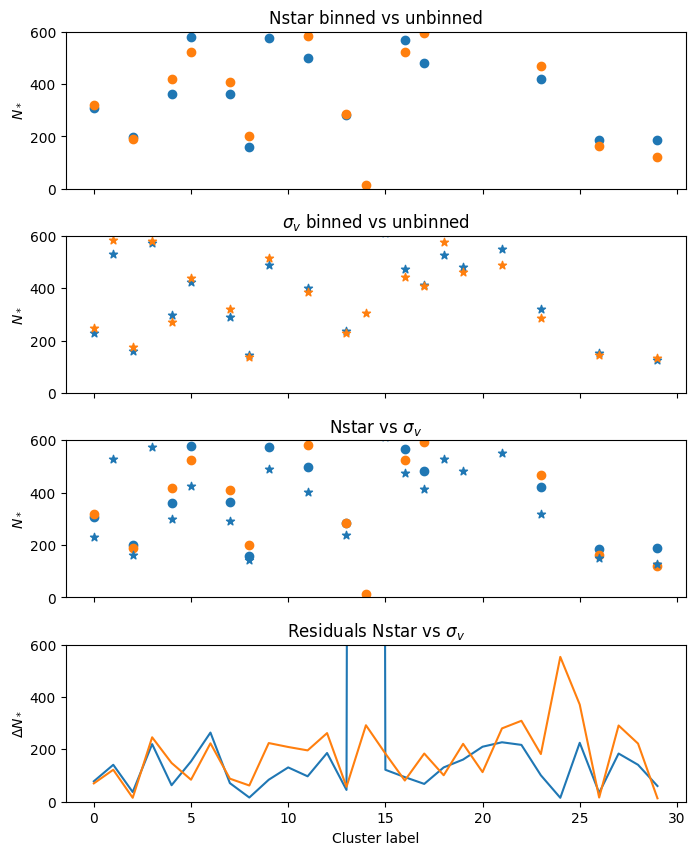

In [78]:
fig,ax = plt.subplots(4,1, sharey="col",sharex="col", figsize=(8,10))

ax[0].scatter(res_df.labels_SigMA.unique(), nstar_counts_unbinned, label="Nstar unbinned")
ax[0].scatter(res_df.labels_SigMA.unique(), nstar_counts_binned, label="Nstar binned")
ax[0].set_title("Nstar binned vs unbinned")
ax[1].scatter(res_df.labels_SigMA.unique(), v_disp_counts_unbinned, label=r"$\sigma_v$ unbinned", marker="*", )
ax[1].scatter(res_df.labels_SigMA.unique(), v_disp_counts_binned, label=r"$\sigma_v$ binned", marker="*")
ax[1].set_title(r"$\sigma_{v}$ binned vs unbinned")
ax[2].scatter(res_df.labels_SigMA.unique(), nstar_counts_unbinned, label="Nstar unbinned")
ax[2].scatter(res_df.labels_SigMA.unique(), nstar_counts_binned, label="Nstar binned")
ax[2].scatter(res_df.labels_SigMA.unique(), v_disp_counts_unbinned, label=r"$\sigma_v$ unbinned", marker="*", color='#1f77b4')
ax[2].set_title(r"Nstar vs $\sigma_{v}$")
ax[3].plot(res_df.labels_SigMA.unique(), abs(np.array(nstar_counts_unbinned)-np.array(v_disp_counts_unbinned)), label="unbinned")
ax[3].plot(res_df.labels_SigMA.unique(), abs(np.array(nstar_counts_binned)-np.array(v_disp_counts_binned)), label="binned")
ax[3].set_title(r"Residuals Nstar vs $\sigma_{v}$")
ax[3].set_ylim(0,600)




ax[3].set_xlabel("Cluster label")
ax[0].set_ylabel(r"$N_*$")
ax[1].set_ylabel(r"$N_*$")
ax[2].set_ylabel(r"$N_*$")
ax[3].set_ylabel(r"$\Delta N_*$")

plt.subplots_adjust(hspace=0.3)

plt.show()

## 5. Interactive analysis

Start easy: Make an XYZ plot and a velocity plot and highlight the stars above a certain density threshold

In [79]:
def plot_cluster(label_id: int, df: pd.DataFrame, rho_threshs:list, filename: str, output_pathname: str = None, hrd: bool = True,
                  return_fig: bool = False):

    vel1 = "v_a_lsr"
    vel2 = "v_d_lsr"

    plt_colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#FF6692', '#B6E880', '#FF97FF',
                  '#FECB52', '#B82E2E', '#316395']

    #  ---------------  Create figure  ---------------
    #  --------------- ---------------  --------------
    fig = make_subplots(
        rows=1, cols=2,
        specs=[[{"type": "scatter3d"}, {"type": "xy"}]],
        column_widths=[0.7, 0.3],
        subplot_titles=['position', 'velocity'], )

    rho_thresh = rho_threshs[label_id]
    # Set density thresholds for slider steps
    density_min = df['density'].min()
    density_max = df['density'].max()
    n_steps = 10
    density_thresholds = np.linspace(density_min, density_max, n_steps)

    # --------------- 3D scatter plot -------------------

    traces = []
    steps = []

    for step_idx, rho in enumerate(density_thresholds):
        # Update labels based on current threshold
        mask = (df.labels_SigMA == i) & (df.density < rho)
        df.loc[mask, "labels_SigMA"] = -1

        cs = df.labels_SigMA
        df_plot = df.loc[cs != -1]
        clustering_solution = cs.astype(int)
        clustering_solution = clustering_solution[clustering_solution != -1]
        plot_points = (clustering_solution == label_id)

        # 3D scatter
        trace_3d = go.Scatter3d(
            x=df_plot.loc[plot_points, 'X'],
            y=df_plot.loc[plot_points, 'Y'],
            z=df_plot.loc[plot_points, 'Z'],
            mode='markers',
            marker=dict(size=3, color=plt_colors[label_id % len(plt_colors)]),
            hoverinfo='none',
            showlegend=False
        )
        fig.add_trace(trace_3d, row=1, col=1)

        # 2D scatter
        trace_vel = go.Scatter(
            x=df_plot.loc[plot_points, vel1],
            y=df_plot.loc[plot_points, vel2],
            mode='markers',
            marker=dict(size=3, color=plt_colors[label_id % len(plt_colors)]),
            hoverinfo='none',
            showlegend=False
        )
        fig.add_trace(trace_vel, row=1, col=2)

        # Each step now controls 2 traces: trace_3d and trace_vel
        n_total_steps = len(density_thresholds)
        visibility = [False] * (2 * n_total_steps)
        visibility[2 * step_idx] = True       # 3D trace
        visibility[2 * step_idx + 1] = True   # 2D trace

        steps.append(dict(
            method='update',
            args=[{'visible': visibility},
                  {'title': f'Density Threshold: {rho:.2f}'}],
            label=f'{rho:.2f}'
        ))

    # Add slider to layout
    sliders = [dict(
        active=0,
        currentvalue={"prefix": "Density threshold: "},
        pad={"t": 50},
        steps=steps
)]

    # ------------ Update axis information ---------------
    # 3d position
    plt_kwargs = dict(showbackground=False, showline=False, zeroline=True, zerolinecolor='white', zerolinewidth=2,
                      showgrid=True, showticklabels=True, color="white",
                      linecolor='white', linewidth=1, gridcolor='white')

  #  xaxis = dict(**plt_kwargs, title='X [pc]')  # , tickmode = 'linear', dtick = 50, range=[-50,200])
  #  yaxis = dict(**plt_kwargs, title='Y [pc]')  # , tickmode = 'linear', dtick = 50, range=[-200, 50])
  #  zaxis = dict(**plt_kwargs, title='Z [pc]')  # , tickmode = 'linear', dtick = 50, range=[-100, 150])

    # tangential vel
    fig.update_xaxes(title_text="v_a_lsr", showgrid=False, row=1, col=2, color="white")
    fig.update_yaxes(title_text="v_d_lsr", showgrid=False, row=1, col=2, color="white")
    # tangential vel

    # Finalize layout
    fig.update_layout(
        sliders=sliders,
        title="",
        # width=800,
        # height=800,
        showlegend=True,
        paper_bgcolor='#383838',
        plot_bgcolor='#383838',
        legend=dict(itemsizing='constant'),
        # 3D plot
        scene=dict(
            xaxis=dict(**plt_kwargs, title='X [pc]', range=[df['X'].min(), df['X'].max()]),
            yaxis=dict(**plt_kwargs, title='Y [pc]', range=[df['Y'].min(), df['Y'].max()]),
            zaxis=dict(**plt_kwargs, title='Z [pc]', range=[df['Z'].min(), df['Z'].max()])
             ),
        xaxis2=dict(title=vel1, range=[df['v_a_lsr'].min(), df['v_a_lsr'].max()]),  # 2D velocity subplot (subplot 1,2)
        yaxis2=dict(title=vel2, range=[df['v_d_lsr'].min(), df['v_d_lsr'].max()]),
        )



    if output_pathname:
        fig.write_html(output_pathname + f"{filename}.html")

    if return_fig:
        return fig


In [80]:
# test cluster
i =27
cluster = res_df[res_df.labels_SigMA == i]
cluster_sorted = cluster.sort_values(by="density")

In [81]:
test = plot_cluster(label_id=i, df=cluster_sorted,rho_threshs=nstar_elbows_unbinned, filename="test.html" ,return_fig=True)
test